In [4]:
import eDiskplot as eplot
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
from astropy.visualization import AsinhStretch
from eDisk_source_dict import source_dict
import scipy.constants as sc
%matplotlib widget
%load_ext autoreload
%autoreload 2

plt.rcParams.update({
    "xtick.top": True,
    "ytick.right": True})

source = "L1489IRS"
molecular_lines = ["12CO", "13CO", "C18O", "SO"]
imagepath = "/raid/work/yamato/eDisk_data/L1489IRS/ALMA_pipeline_reduced_data/try1_continuum_nterms1/"
productpath = "/raid/work/yamato/eDisk_data/L1489IRS/data_product_test/"
wedge = 90
rmax = 8
rmax_zoomed = 2.5
moment = ["M0", "M1", "M8"]
baseline = "SBLB"
vsys = source_dict[source]["v_sys"]
vrange = 5
data_scaling_factor = {"M0": 1.0,
                       "M1": 1e-3,
                       "M8": 1,}
norm_kwargs = {"M0": dict(stretch=AsinhStretch(a=0.1), vmin=0.0),
               "M1": dict(vmin=vsys-vrange, vmax=vsys+vrange),
               "M8": dict()}
beam_kw = {"M0": dict(fill=True, color="white"),
           "M1": dict(fill=True, color="black"),
           "M8": dict(fill=True, color="white")}
cbar_kw = {"M0": dict(label=r"mJy beam$^{-1}$ km s$^{-1}$"),
           "M1": dict(label=r"km s$^{-1}$"),
           "M8": dict(label=r"K")}
sbar_kw = {"M0": dict(),
           "M1": dict(color="black"),
           "M8": dict(),
}
           

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Continuum
- imaging params: robust=1.0, no uvtaper
- dust disk extent ~ 3 arcsec in radius
- possible ring structure (or emission enhance) at ~0.5 arcsec

<div class="page"/>

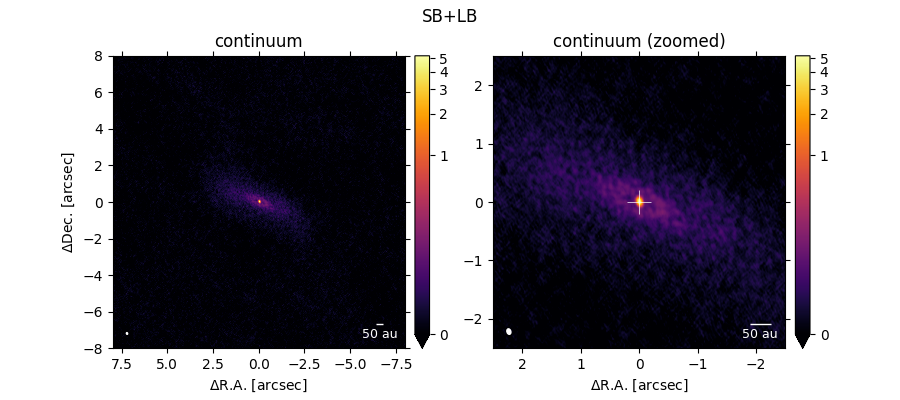

In [15]:
# continuum
################################# SB+LB ####################################################
fig, axes = plt.subplots(1, 2, figsize=(9,4))

imagename = imagepath + "{:s}_{:s}_continuum_robust_1.0.image.tt0.fits".format(
    source, baseline
)

# wide
ax = axes[0]
eplot.plot_map(
    fitsname=imagename,
    ax=ax,
    center_coord=SkyCoord(source_dict[source]["radec"]),
    data_scaling_factor=1e3,
    cmap="inferno",
    norm_kwargs=dict(stretch=AsinhStretch(a=0.02), vmin=0.0),
    beam_kw=beam_kw
)
r = rmax
ax.set(
    xlim=(r, -r),
    ylim=(-r, r),
    xlabel="$\Delta$R.A. [arcsec]",
    ylabel="$\Delta$Dec. [arcsec]",
    title="continuum"
)

# zoomed
ax = axes[1]
eplot.plot_map(
    fitsname=imagename,
    ax=ax,
    center_coord=SkyCoord(source_dict[source]["radec"]),
    data_scaling_factor=1e3,
    cmap="inferno",
    norm_kwargs=dict(stretch=AsinhStretch(a=0.02), vmin=0.0),
    beam_kw=beam_kw
)
r = rmax_zoomed
ax.set(
    xlim=(r, -r),
    ylim=(-r, r),
    xlabel="$\Delta$R.A. [arcsec]",
    title="continuum (zoomed)"
)
# check the peak position
ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

fig.suptitle("SB+LB");

## Characterization of dust disk structure by image domain fit
- two 2D Gaussian (central small and outer broad component) are fitted to the data 
- significant residual appeared due to the dust ring

### Estimated disk geometry
- central small disk
    - disk size: 0.10 arcsec x 0.069 arcsec
    - peak position: (61.17949985, 26.31558848) in deg
    - inclination: 46.4 deg

- broad disk
    - disk size: 4.1 arcsec x 1.4 arcsec
    - peak position: (61.17951863, 26.31558898) in deg
    - inclination: 70.7 deg



![imfit](./imfit_L1489IRS_SBLB_continuum_robust_1.0/L1489IRS_SBLB_continuum_robust_1.0.imfit.fit.png)


## Characterization of dust emission structure by visibility fit with GALARIO
### TBD

# Lines
## Detection summary
- Judge on the chennel maps on CARTA by eye

| Transition     | Rest Frequency [GHz] | E_up [K] | Channel width [km/s] | Detection in SB+LB? | Detection in SB? | 
| :--            | :--                  | :--      | :--                  | :--        | :--                       |
| 12CO (J=2-1)   | 230.538              | 16.6     | 0.635                |  Y         | Y |
| 13CO (J=2-1)   | 220.39868420         | 15.9     | 0.167                |  Y         | Y |
| C18O (J=2-1)   | 219.56035410         | 15.8     | 0.167                |  Y         | Y |
| SO   (6_5-5_4) | 219.94944200         | 35.0     | 0.167                |  Y         | Y |
| H2CO (3_21-2_20) | 218.76006600       | 68.1     | 0.167                |  N         | Y |
| H2CO (3_03-2_02) | 218.22219200       | 21.0     | 1.34                 |  Y         | Y |
| H2CO (3_22-2_21) | 218.47563200       | 68.1     | 1.34                 |  Y (very faint)         | Y |
| c-C3H2 (6_06-5_15) | 217.82215          | 38.6   | 1.34                 |  Y         | Y  | 
| c-C3H2 (5_14-4_23) | 217.94005          | 35.4   | 1.34                 |  Y         | Y  |
| c-C3H2 (5_24-4_13) | 218.16044          | 35.4   | 1.34                 |  Y (very faint)      | Y   | 
| DCN (J=3-2)    | 217.2386               | 20.9   | 1.34                 | Y          | Y  |
| CH3OH (4_2-3_1) | 218.44006300          | 45.5   | 1.34                 | N          | N?  |


## 12CO
- 12CO traces both outflow cavities and centeral component
- complicated velocity structure in south side

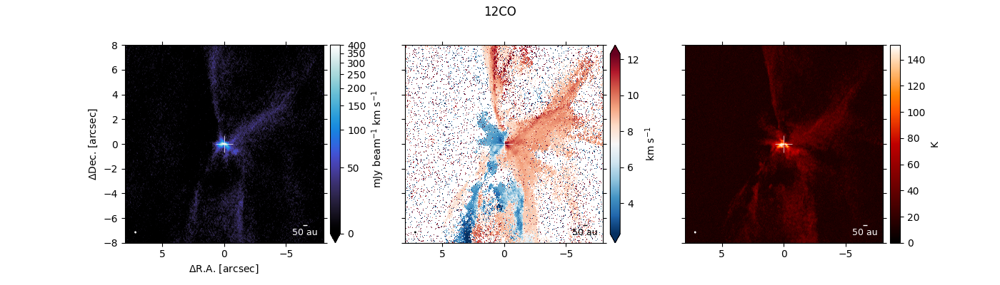

In [5]:
line = "12CO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)
# rmax = 0.5
for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line)
plt.subplots_adjust(wspace=0.3)

/home/yamato/Project/qDisk/qdisk/utils.py:121: RuntimeWarning: divide by zero encountered in true_divide
  T = h * nu / k_B / np.log(1 + 2 * h * nu**3 / (c**2 * T))


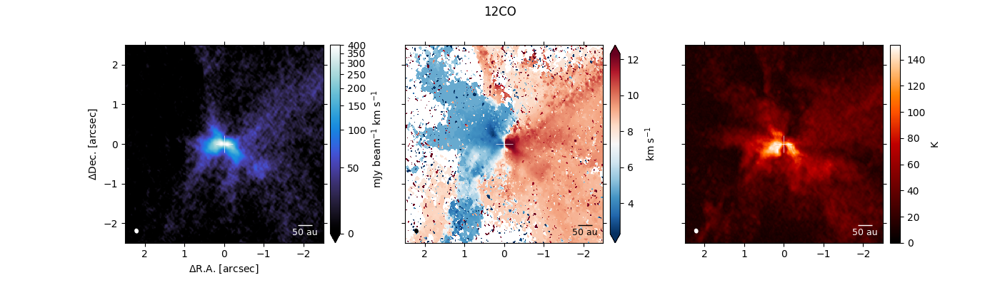

In [14]:
line = "12CO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)
# rmax = 0.5
for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax_zoomed, -rmax_zoomed), ylim=(-rmax_zoomed, rmax_zoomed))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line)
plt.subplots_adjust(wspace=0.3)

## 13CO
- 12CO mainly traces Keplerian disk
- similar tilted disk to Sai et al. (2020)

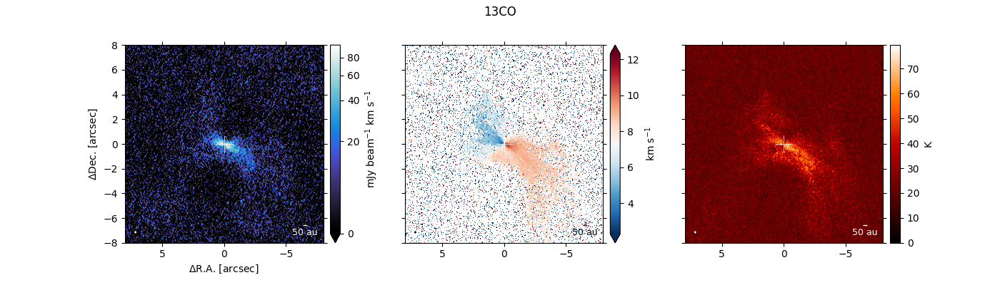

In [6]:
line = "13CO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line)
plt.subplots_adjust(wspace=0.3)

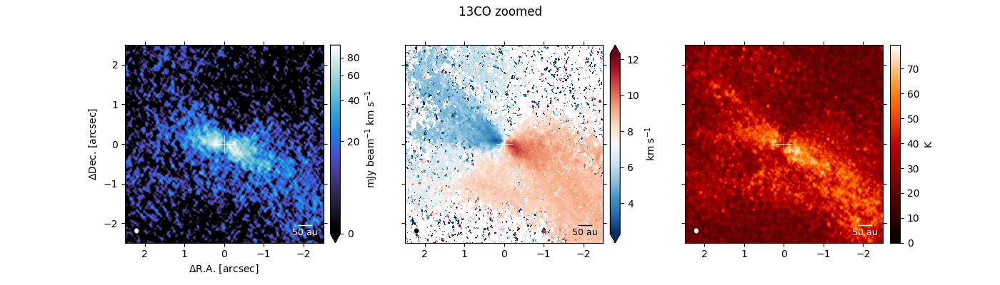

In [13]:
line = "13CO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax_zoomed, -rmax_zoomed), ylim=(-rmax_zoomed, rmax_zoomed))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line+" zoomed")
plt.subplots_adjust(wspace=0.3)

## C18O
- similar overall morphology as 13CO
- simlar gap as in Sai et al. (2020) at ~200 au but not so appearent
- small-scale staructure is different; C18O mainly trace the disk, and show a cavity or ring structure; may be continuum absorption? 

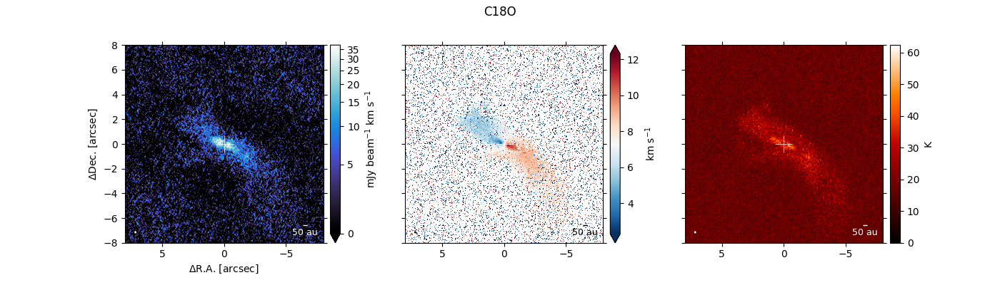

In [7]:
line = "C18O"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line)
plt.subplots_adjust(wspace=0.3)

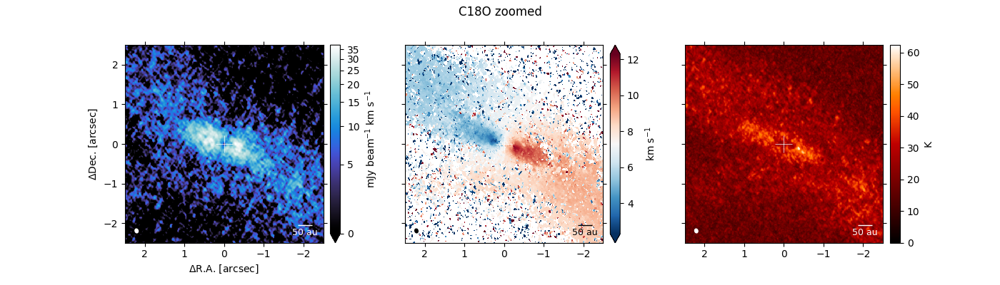

In [9]:
line = "C18O"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax_zoomed, -rmax_zoomed), ylim=(-rmax_zoomed, rmax_zoomed))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line+" zoomed")
plt.subplots_adjust(wspace=0.3)

## SO
- tracing outer edge of the disk, though very faint
- some trail in the midplane
- SO show a really compact disk (~0.1 arcsec) in the vicinity of the protostar
- the compact disk show a velocity gradient along the disk major axis -> possibly Keplerian disk?
- still the origin is unclear

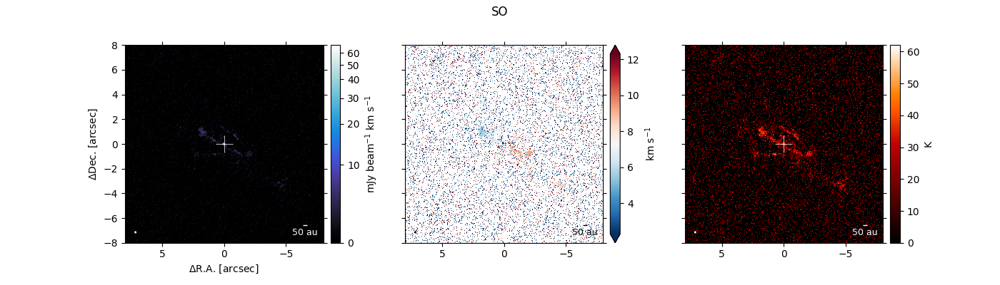

In [8]:
line = "SO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = imagepath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line)
plt.subplots_adjust(wspace=0.3)

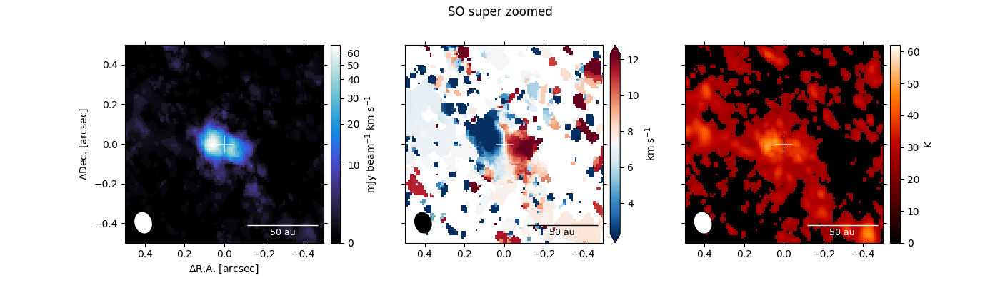

In [10]:
line = "SO"
fig, axes = plt.subplots(1, 3, figsize=(14,4), sharey=True, sharex=True)

rmax_supzoomed = 0.5

for i, m in enumerate(moment):
    ax = axes[i]
    imagename = imagepath + "{:s}_{:s}_{:s}_robust_0.5.image_{:s}.fits".format(
        source, baseline, line, m
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=data_scaling_factor[m],
        in_Tb=True if m == "M8" else False,
        cmap=eplot.cmap[m],
        norm_kwargs=norm_kwargs[m],
        beam_kw=beam_kw[m],
        cbar_kw=cbar_kw[m],
        sbar_kw=sbar_kw[m]
    )
    ax.set(xlim=(rmax_supzoomed, -rmax_supzoomed), ylim=(-rmax_supzoomed, rmax_supzoomed))
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle(line+" super zoomed")
plt.subplots_adjust(wspace=0.3)

## Comparison of the radial emission profile of continuum, 13CO, C18O, SO
- Continuum show a clear ring structure at ~0.4"
- all lines show ring-like structures (or central cavity), but the ring peak is different
- 13CO peaks at ~0.2-0.3", C18O peaks at ~0.4", and SO peaks at ~0.1"
- continuum ring and C18O is well correlated

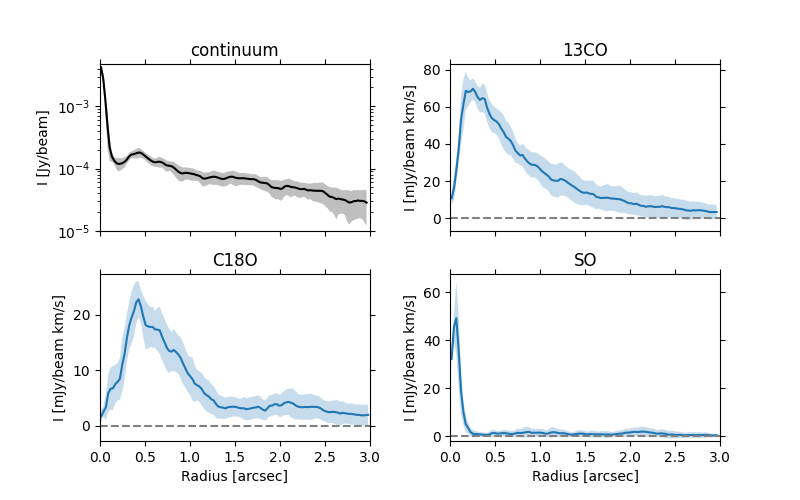

In [11]:
baseline = "SBLB"
# radial profile
molecular_lines = ["13CO", "C18O", "SO"]
fig, axes = plt.subplots(2, 2, figsize=(8, 5), sharey=False, sharex=True)

# continuum
ax = axes.flatten()[0]
profilename = productpath + "{:s}_{:s}_continuum_robust_1.0.profile.wedge{}.txt".format(source, baseline, wedge)
eplot.plot_radial_profile(profilename, ax=ax, color="black")

ax.set(xlim=(0.0, 3.0), ylim=(1e-5, None), title="continuum", ylabel="I [Jy/beam]", yscale="log")
ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
ax.axhline(y=0.0, color="gray", ls="dashed")


# lines
for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i+1]
    profilename = productpath + "{:s}_{:s}_{:s}_robust_0.5.profile.wedge{}.txt".format(source, baseline, line, wedge)

    eplot.plot_radial_profile(profilename, ax=ax)

    ax.set(xlim=(0.0, 3.0), title=line, ylabel="I [mJy/beam km/s]")
    if line != "13CO":
        ax.set(xlabel="Radius [arcsec]")
    ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
    ax.axhline(y=0.0, color="gray", ls="dashed")

plt.subplots_adjust(wspace=0.3)



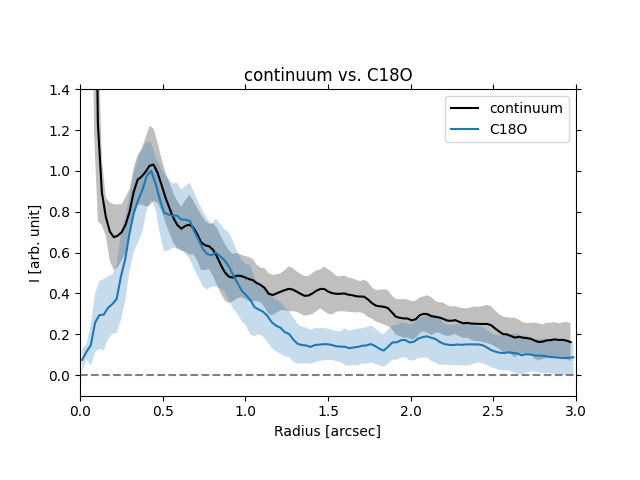

In [12]:
# continuum vs C18O
line = "C18O"
fig, ax = plt.subplots()
contprofilename = productpath + "{:s}_{:s}_continuum_robust_1.0.profile.wedge{}.txt".format(source, baseline, wedge)
C18Oprofilename = productpath + "{:s}_{:s}_{:s}_robust_0.5.profile.wedge{}.txt".format(source, baseline, line, wedge)

eplot.plot_radial_profile(contprofilename, ax=ax, color="black", normalize=True, scale=24, label="continuum")
eplot.plot_radial_profile(C18Oprofilename, ax=ax, normalize=True, label="C18O")

ax.set(xlim=(0.0, 3.0), ylim=(-0.1,1.4), title="continuum vs. C18O", xlabel="Radius [arcsec]", ylabel="I [arb. unit]")
ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
ax.axhline(y=0.0, color="gray", ls="dashed")
ax.legend();


# 12CO
## Velocity-integrated intensity (moment 0) maps of 12CO, 13CO, C18O, SO
### SB+LB
- these lines will be relevant for first-look paper
- 12CO traces the central dense component and outflow cavities
- 13CO and C18O mainly traces the disk component, up to ~5 arcsec?
- 13CO and C18O possibly show a inner small cavity? possibly caused by cabsorption against optically thick continuum
- SO shows a centrally peaked morphology; no absorption? need careful comparisons with continuum
- maps are a bit noisy except 12CO; may consider some masking? (clean mask, Keplerian mask, sigma-clipping, etc.)

### SB-only
- basically the same morphologies as SB+LB
- still a bit noisy (in particular SO), may consider masking

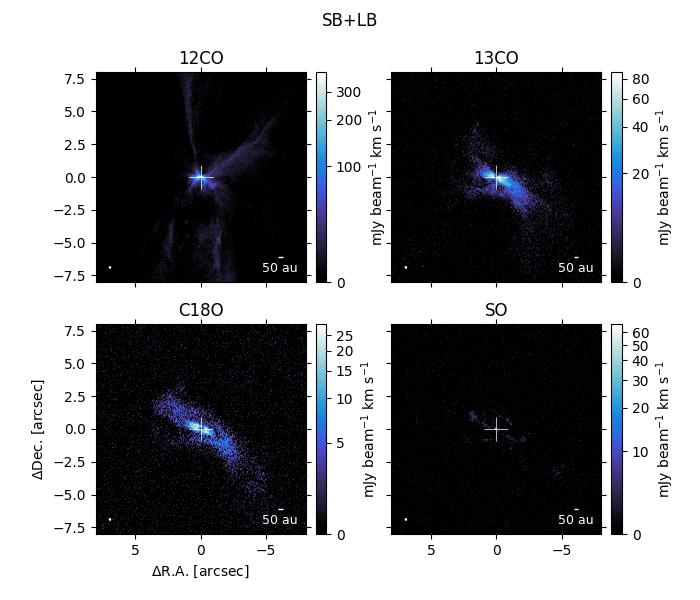

In [16]:
# lines
########################## SB+LB #################################
baseline = "SBLB"

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)

for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M0.fits".format(
        source, baseline, line, wedge
    )

    imagename = imagepath + "{:s}_{:s}_{:s}_robust_0.5.image_M0.fits".format(
        source, baseline, line, wedge
    )

    if line == "12CO":
        imagename = imagename.replace(".image_M0.fits", ".image.sub_M0.fits")

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        cmap=eplot.cpal,
        norm_kwargs=dict(stretch=AsinhStretch(a=0.1), vmin=0.0),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"mJy beam$^{-1}$ km s$^{-1}$")
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle("SB+LB")
plt.subplots_adjust(wspace=0.2, hspace=0.2)


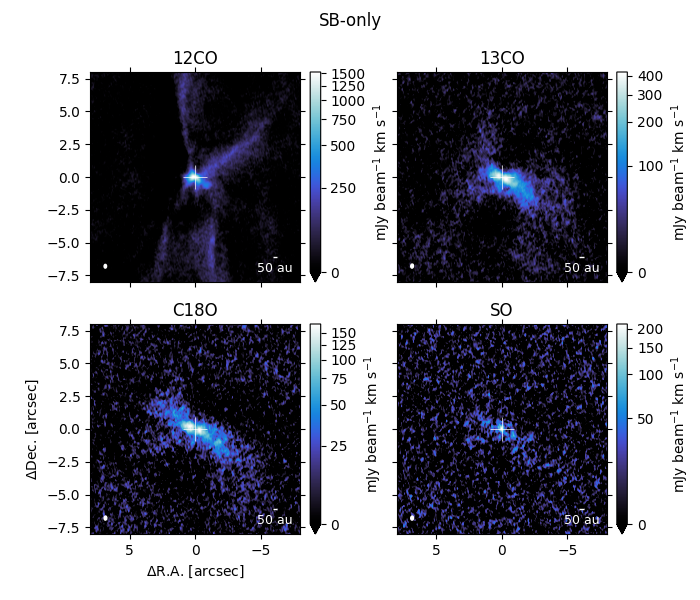

In [3]:

########################### SB only #####################################
baseline = "SB"

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)

ax = axes.flatten()[0]
imagename = imagepath + "{:s}_{:s}_continuum_robust_1.0.image.tt0.fits".format(
    source, baseline
)

for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M0.fits".format(
        source, baseline, line, wedge
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        cmap=eplot.cpal,
        norm_kwargs=dict(stretch=AsinhStretch(a=0.1), vmin=0.0),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"mJy beam$^{-1}$ km s$^{-1}$")
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)
    ax.scatter(0.0, 0.0, marker="+", color="white", linewidths=0.5, s=300)

axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle("SB-only")
plt.subplots_adjust(wspace=0.3, hspace=0.2)

## Radial emission profiles of continuum and 13CO, C18O and SO
### Radial profile generation
1. deproject the disk using inclination, position angle, and disk center of dust disk estimated by 2D Gaussian fit (or visibility fit)
1. cut radial bins with a bin width of 1/4 beam major axis
1. azimuthally averaged the emission and the standard deviation of the averaged values are taken as the uncertainty of each radial bin




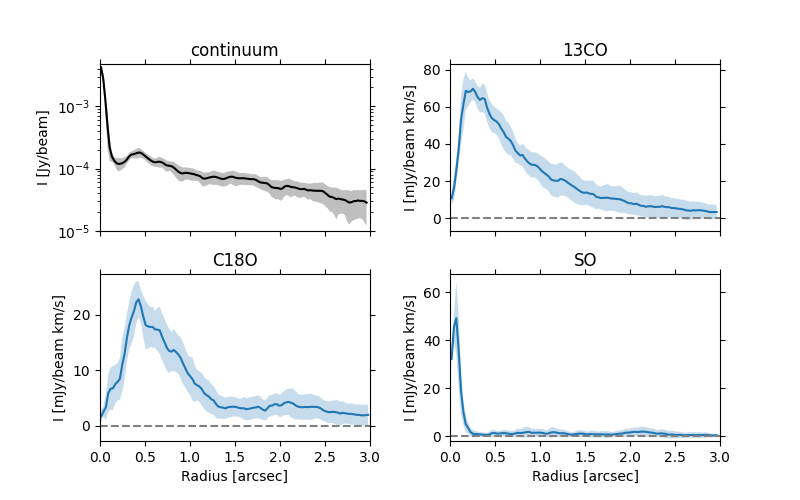

In [4]:
baseline = "SBLB"
# radial profile
molecular_lines = ["13CO", "C18O", "SO"]
fig, axes = plt.subplots(2, 2, figsize=(8, 5), sharey=False, sharex=True)

# continuum
ax = axes.flatten()[0]
profilename = productpath + "{:s}_{:s}_continuum_robust_1.0.profile.wedge{}.txt".format(source, baseline, wedge)
eplot.plot_radial_profile(profilename, ax=ax, color="black")

ax.set(xlim=(0.0, 3.0), ylim=(1e-5, None), title="continuum", ylabel="I [Jy/beam]", yscale="log")
ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
ax.axhline(y=0.0, color="gray", ls="dashed")


# lines
for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i+1]
    profilename = productpath + "{:s}_{:s}_{:s}_robust_0.5.profile.wedge{}.txt".format(source, baseline, line, wedge)

    eplot.plot_radial_profile(profilename, ax=ax)

    ax.set(xlim=(0.0, 3.0), title=line, ylabel="I [mJy/beam km/s]")
    if line != "13CO":
        ax.set(xlabel="Radius [arcsec]")
    ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
    ax.axhline(y=0.0, color="gray", ls="dashed")

plt.subplots_adjust(wspace=0.3)



## Comparison between continuum and C18O
- continuum and C18O rings at ~0.5 arcsec really well coincide with each other!
- in the inner most region (<0.2 arcsec), continuum gets stronger and C18O get weaker, matbe due to the absorption against the continuum
- a prominent difference at 1--2 arcsec region; tracing different temperature region? or not that the warped structure appeared around here only in gas disk

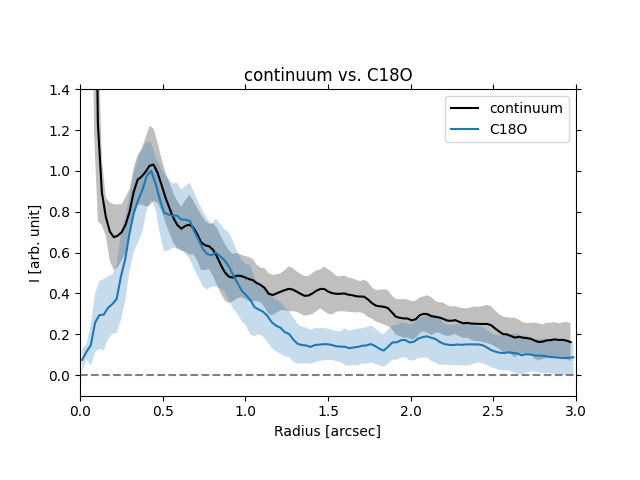

In [5]:
# continuum vs C18O
line = "C18O"
fig, ax = plt.subplots()
contprofilename = productpath + "{:s}_{:s}_continuum_robust_1.0.profile.wedge{}.txt".format(source, baseline, wedge)
C18Oprofilename = productpath + "{:s}_{:s}_{:s}_robust_0.5.profile.wedge{}.txt".format(source, baseline, line, wedge)

eplot.plot_radial_profile(contprofilename, ax=ax, color="black", normalize=True, scale=24, label="continuum")
eplot.plot_radial_profile(C18Oprofilename, ax=ax, normalize=True, label="C18O")

ax.set(xlim=(0.0, 3.0), ylim=(-0.1,1.4), title="continuum vs. C18O", xlabel="Radius [arcsec]", ylabel="I [arb. unit]")
ax.set_aspect(1./ax.get_data_ratio()/sc.golden_ratio, adjustable="box")
ax.axhline(y=0.0, color="gray", ls="dashed")
ax.legend()


## Velocity structure: moment 1 maps of 12CO, 13CO, C18O, SO
- 12CO traces the central component and outflow cavity
- 13CO and C18O mianly traces the disk component, though C18 is less extended
- SO also shows the velocity gradient as well, but faint

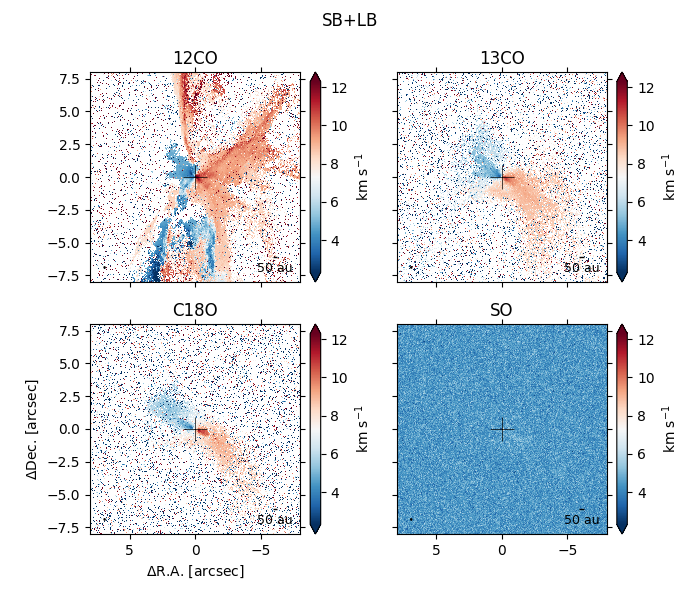

In [6]:
########################## SB+LB #################################
vrange = 5 # in km/s
vsys = source_dict[source]["v_sys"]
molecular_lines = ["12CO", "13CO", "C18O", "SO"]
beam_kw["color"] = "black"

baseline = "SBLB"

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)

for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M1.fits".format(
        source, baseline, line, wedge
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=1e-3,
        cmap=eplot.cmap[1],
        norm_kwargs=dict(vmin=vsys-vrange, vmax=vsys+vrange),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"km s$^{-1}$"),
        sbar_kw=dict(color="black")
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)
    ax.scatter(0.0, 0.0, marker="+", color="black", linewidths=0.5, s=300)

axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle("SB+LB")
plt.subplots_adjust(wspace=0.3, hspace=0.2)
    

## zoomed 
- SO has a really compact rotating disk! (really?)

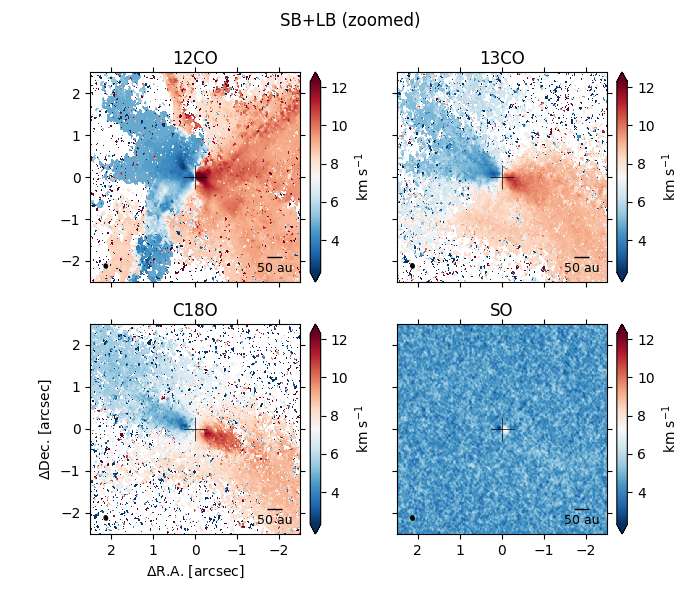

In [7]:
########################## SB+LB #################################
vrange = 5 # in km/s
vsys = source_dict[source]["v_sys"]
molecular_lines = ["12CO", "13CO", "C18O", "SO"]

baseline = "SBLB"

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)

for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M1.fits".format(
        source, baseline, line, wedge
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=1e-3,
        cmap=eplot.cmap[1],
        norm_kwargs=dict(vmin=vsys-vrange, vmax=vsys+vrange),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"km s$^{-1}$"),
        sbar_kw=dict(color="black")
    )
    ax.set(xlim=(rmax_zoomed, -rmax_zoomed), ylim=(-rmax_zoomed, rmax_zoomed), title=line)
    ax.scatter(0.0, 0.0, marker="+", color="black", linewidths=0.5, s=300)

axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle("SB+LB (zoomed)")
plt.subplots_adjust(wspace=0.3, hspace=0.2)

## SB-only
- basically same as SB+LB

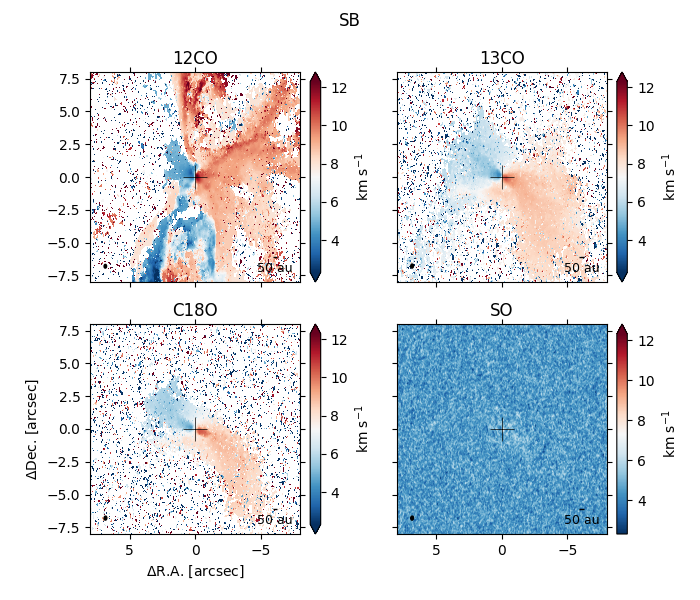

In [8]:
########################## SB-only #################################
vrange = 5 # in km/s
vsys = source_dict[source]["v_sys"]
molecular_lines = ["12CO", "13CO", "C18O", "SO"]

baseline = "SB"

fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)

for i, line in enumerate(molecular_lines):
    ax = axes.flatten()[i]
    imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M1.fits".format(
        source, baseline, line, wedge
    )

    eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=1e-3,
        cmap=eplot.cmap[1],
        norm_kwargs=dict(vmin=vsys-vrange, vmax=vsys+vrange),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"km s$^{-1}$"),
        sbar_kw=dict(color="black")
    )
    ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)
    ax.scatter(0.0, 0.0, marker="+", color="black", linewidths=0.5, s=300)

axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
plt.suptitle("SB")
plt.subplots_adjust(wspace=0.3, hspace=0.2)

## The SO compact disk
- SO shows a hyper compact rotating disk at the center (cnotour: continuum)

[(0.5, -0.5), (-0.5, 0.5), Text(0.5, 1.0, 'SO')]

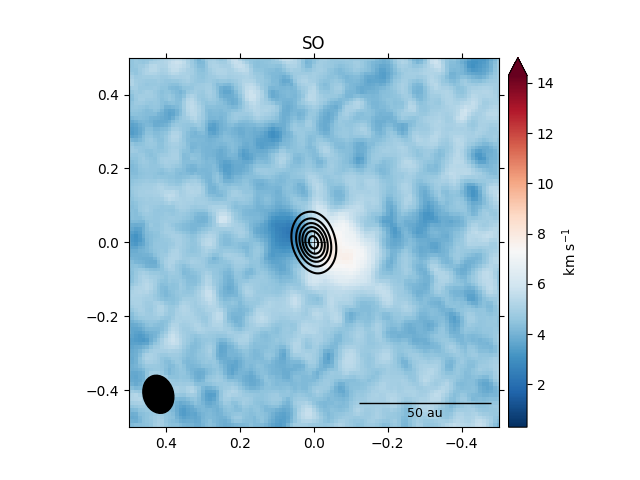

In [10]:
baseline = "SBLB"

line = "SO"
vrange = 7

fig, ax = plt.subplots()

imagename = productpath + "{:s}_{:s}_{:s}_robust_0.5.image_M1.fits".format(
        source, baseline, line, wedge
    )

rmax = 0.5
eplot.plot_map(
        fitsname=imagename,
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=1e-3,
        cmap=eplot.cmap[1],
        norm_kwargs=dict(vmin=vsys-vrange, vmax=vsys+vrange),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"km s$^{-1}$"),
        sbar_kw=dict(color="black")
    )
ax.scatter(0.0, 0.0, marker="+", color="black", linewidths=0.5, s=300)
axes[1,0].set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)

cont_image = imagepath + "{:s}_{:s}_continuum_robust_1.0.image.tt0.fits".format(
    source, baseline
)

eplot.overlay_contour(fitsname=cont_image, ax=ax, center_coord=SkyCoord(source_dict[source]["radec"]), data_scaling_factor=1e3)
ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)

In [11]:
from casatasks import immoments

help(immoments)

Help on _immoments in module casatasks.immoments object:

class _immoments(builtins.object)
 |  immoments ---- Compute moments from an image
 |  
 |  --------- parameter descriptions ---------------------------------------------
 |  
 |  imagename  Name of the input image
 |  moments    List of moments you would like to compute
 |  axis       The momement axis: ra, dec, lat, long, spectral, or stokes
 |  region     Region selection. Default is to use the full image.
 |  box        Rectangular region(s) to select in direction plane. Default is to use the entire direction plane.
 |  chans      Channels to use. Default is to use all channels.
 |  stokes     Stokes planes to use. Default is to use all Stokes planes.
 |  mask       Mask to use. Default is none.
 |  includepix Range of pixel values to include
 |  excludepix Range of pixel values to exclude
 |  outfile    Output image file name (or root for multiple moments)
 |  stretch    Stretch the mask if necessary and possible?
 |  RETUR

In [26]:
from casatasks import immoments

line = "13CO"
imagename = imagepath + "{:s}_{:s}_{:s}_robust_0.5.image.fits".format(
        source, baseline, line, wedge
    )
outfile = "./immoments.image.13CO"
moments = [1]

immoments(imagename=imagename, moments=moments, outfile=outfile)


....10....20....30....40....50....60....70....80....90....100%


In [28]:
from casatasks import exportfits

exportfits(imagename = outfile, fitsimage="./immoment_test_13CO.fits", dropdeg=True)

[(5.0, -5.0), (-5.0, 5.0), Text(0.5, 1.0, '13CO')]

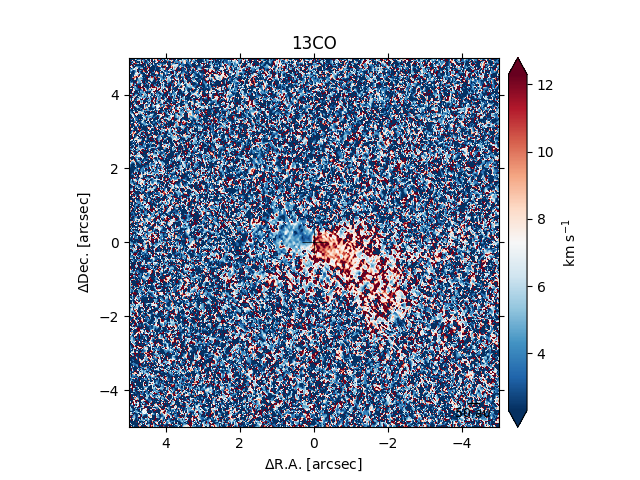

In [31]:
fig, ax = plt.subplots()
rmax = 5
eplot.plot_map(
        fitsname="./immoment_test_13CO.fits",
        ax=ax,
        center_coord=SkyCoord(source_dict[source]["radec"]),
        data_scaling_factor=1,
        cmap=eplot.cmap["M1"],
        norm_kwargs=dict(vmin=vsys-vrange, vmax=vsys+vrange),
        beam_kw=beam_kw,
        cbar_kw=dict(label=r"km s$^{-1}$"),
        sbar_kw=dict(color="black")
    )
ax.scatter(0.0, 0.0, marker="+", color="black", linewidths=0.5, s=300)
ax.set(xlabel="$\Delta$R.A. [arcsec]", ylabel="$\Delta$Dec. [arcsec]",)
ax.set(xlim=(rmax, -rmax), ylim=(-rmax, rmax), title=line)

In [23]:
from qdisk.classes import FitsImage

im = FitsImage("./immoment_test.fits")
im.header

SIMPLE  =                    T /Standard FITS                                   
BITPIX  =                  -32 /Floating point (32 bit)                         
NAXIS   =                    2                                                  
NAXIS1  =                 4000                                                  
NAXIS2  =                 4000                                                  
EXTEND  =                    T                                                  
BSCALE  =   1.000000000000E+00 /PHYSICAL = PIXEL*BSCALE + BZERO                 
BZERO   =   0.000000000000E+00                                                  
BMAJ    =   2.906848124293E-05                                                  
BMIN    =   2.268743482189E-05                                                  
BPA     =   1.680827060011E+01                                                  
BTYPE   = 'Intensity'                                                           
OBJECT  = 'L1489IRS'        

In [ ]:
import astropy.units as u
